In [2]:
import os

import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision.models import resnet50, ResNet50_Weights
from torch.utils.data import DataLoader, random_split
import torch.nn as nn
import torchvision.models as models
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
import timm

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

import opendatasets as od
import time

from sklearn.metrics import confusion_matrix

import cv2
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import preprocess_image
from PIL import Image

In [3]:
# Kaggle dataset URL
dataset_url = 'https://www.kaggle.com/jutrera/stanford-car-dataset-by-classes-folder'

# Download dataset
od.download(dataset_url)

Skipping, found downloaded files in ".\stanford-car-dataset-by-classes-folder" (use force=True to force download)


In [4]:

# Define dataset paths
DATA_DIR_TRAIN = './stanford-car-dataset-by-classes-folder/car_data/car_data/train'
DATA_DIR_TEST = './stanford-car-dataset-by-classes-folder/car_data/car_data/test'

# Get class names
train_classes = sorted(os.listdir(DATA_DIR_TRAIN))
test_classes = sorted(os.listdir(DATA_DIR_TEST))

# Create class-to-index mapping
train_class_to_idx = {train_classes[i]: i for i in range(len(train_classes))}
test_class_to_idx = {test_classes[i]: i for i in range(len(test_classes))}

# Verify class names
print("Train Classes:", train_classes[:5])
print("Test Classes:", test_classes[:5])

# Check if class mapping is the same
print("Are Train & Test Classes the Same?", train_classes == test_classes)

Train Classes: ['AM General Hummer SUV 2000', 'Acura Integra Type R 2001', 'Acura RL Sedan 2012', 'Acura TL Sedan 2012', 'Acura TL Type-S 2008']
Test Classes: ['AM General Hummer SUV 2000', 'Acura Integra Type R 2001', 'Acura RL Sedan 2012', 'Acura TL Sedan 2012', 'Acura TL Type-S 2008']
Are Train & Test Classes the Same? True


In [45]:
# Count images per class
class_counts = {class_name: len(os.listdir(os.path.join(DATA_DIR_TRAIN, class_name))) for class_name in os.listdir(DATA_DIR_TRAIN)}

# Convert to DataFrame for easy visualization
df_class_distribution = pd.DataFrame(list(class_counts.items()), columns=['Class Name', 'Image Count'])
df_class_distribution = df_class_distribution.sort_values(by='Image Count', ascending=False)

# Display top 5 highest and lowest classes differences
print ("Top 5 Highest Image Count Classes")
print(df_class_distribution.head(5))
print ("Top 10 Lowest Image Count Classes")
print(df_class_distribution.tail(5))

Top 5 Highest Image Count Classes
                                   Class Name  Image Count
120                       GMC Savana Van 2012           68
75                    Chrysler 300 SRT-8 2010           49
166              Mitsubishi Lancer Sedan 2012           48
159  Mercedes-Benz 300-Class Convertible 1993           48
143                        Jaguar XK XKR 2012           47
Top 10 Lowest Image Count Classes
                                            Class Name  Image Count
175  Rolls-Royce Phantom Drophead Coupe Convertible...           31
59                    Chevrolet Express Cargo Van 2007           30
156                 Maybach Landaulet Convertible 2012           29
102                               FIAT 500 Abarth 2012           28
129                          Hyundai Accent Sedan 2012           24


Sample images from Training Set:


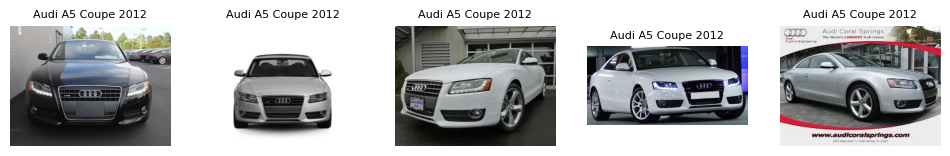

Sample images from Test Set:


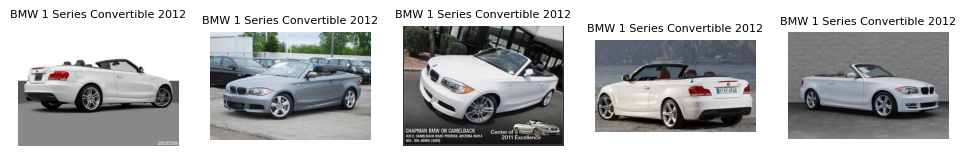

In [6]:
import matplotlib.pyplot as plt
import random
from PIL import Image

# Function to display random images from a class folder
def show_random_images(dataset_path, num_images=5):
    class_names = os.listdir(dataset_path)  # Get class names
    selected_class = random.choice(class_names)  # Pick a random class
    class_path = os.path.join(dataset_path, selected_class)  # Get class path
    images = os.listdir(class_path)  # Get image names
    
    plt.figure(figsize=(12, 4))
    for i in range(min(num_images, len(images))):
        img_path = os.path.join(class_path, images[i])
        img = Image.open(img_path)  # Load image

        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(selected_class, fontsize=8)
        plt.axis("off")
    
    plt.show()

# Show sample images from train dataset
print("Sample images from Training Set:")
show_random_images(DATA_DIR_TRAIN)

# Show sample images from test dataset
print("Sample images from Test Set:")
show_random_images(DATA_DIR_TEST)


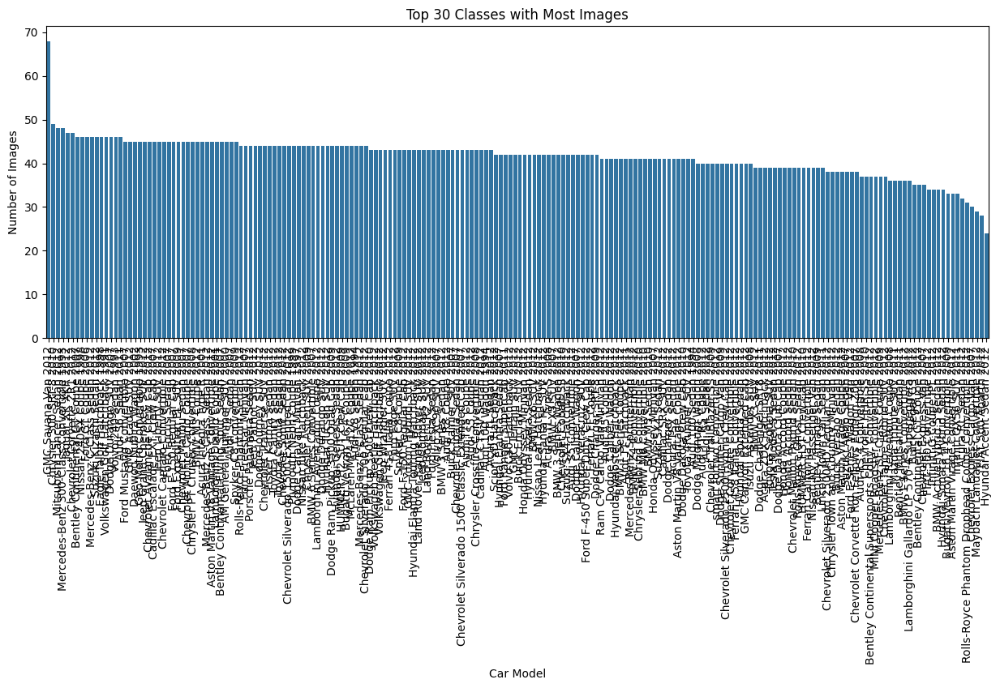

In [7]:
plt.figure(figsize=(15, 5))
sns.barplot(data=df_class_distribution, x="Class Name", y="Image Count")
plt.xticks(rotation=90)
plt.title("Top 30 Classes with Most Images")
plt.xlabel("Car Model")
plt.ylabel("Number of Images")
plt.show()

Sample images from Training Set:


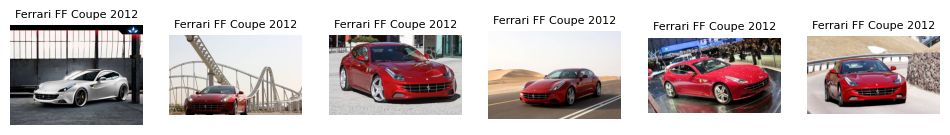

Sample images from Test Set:


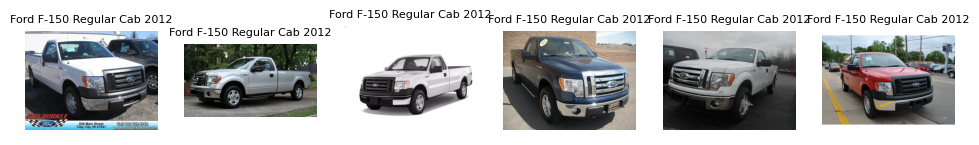

In [8]:
import matplotlib.pyplot as plt
import random
from PIL import Image

# Function to display random images from a class folder
def show_random_images(dataset_path, num_images=6):
    class_names = os.listdir(dataset_path)  # Get class names
    selected_class = random.choice(class_names)  # Pick a random class
    class_path = os.path.join(dataset_path, selected_class)  # Get class path
    images = os.listdir(class_path)  # Get image names
    
    plt.figure(figsize=(12, 4))
    for i in range(min(num_images, len(images))):
        img_path = os.path.join(class_path, images[i])
        img = Image.open(img_path)  # Load image

        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(selected_class, fontsize=8)
        plt.axis("off")
    
    plt.show()

# Show sample images from train dataset
print("Sample images from Training Set:")
show_random_images(DATA_DIR_TRAIN)

# Show sample images from test dataset
print("Sample images from Test Set:")
show_random_images(DATA_DIR_TEST)


In [9]:
# Define transformations (Resize, Normalize, Augmentation)
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images
    transforms.RandomHorizontalFlip(),  # Data Augmentation (Flipping)
    transforms.RandomRotation(15),  # Random Rotation
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize
])

# Load train and test datasets
train_dataset = ImageFolder(root=DATA_DIR_TRAIN, transform=transform)
test_dataset = ImageFolder(root=DATA_DIR_TEST, transform=transform)

# Create DataLoaders for batch processing
BATCH_SIZE = 32
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
# test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
# Calculate sizes for validation and test sets (50% each)
val_size = len(test_dataset) // 2
test_size = len(test_dataset) - val_size

# Split the test dataset
val_dataset, test_dataset = random_split(test_dataset, [val_size, test_size])

# Create DataLoaders for validation and test sets
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

# Print dataset details
print(f"Train Dataset Size: {len(train_dataset)} images")
print(f"Validation Dataset Size: {len(val_dataset)} images")
print(f"Test Dataset Size: {len(test_dataset)} images")
print(f"Number of Classes: {len(train_dataset.classes)}")


Train Dataset Size: 8144 images
Validation Dataset Size: 4037 images
Test Dataset Size: 4038 images
Number of Classes: 196


In [10]:
# Load Pretrained ResNet-50
resnet_model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)

# Modify the classifier for 196 car classes
num_classes = len(train_dataset.classes)
resnet_model.fc = nn.Linear(resnet_model.fc.in_features, num_classes)

In [11]:
# Load TResNet-L model from TIMM library
tresnet_model = timm.create_model("tresnet_l", pretrained=True, num_classes=num_classes)

In [12]:
# Load ViT model from TIMM library
vit_model = timm.create_model("vit_base_patch16_224", pretrained=True, num_classes=num_classes)

In [13]:
# Define CBAM (Convolutional Block Attention Module)
class CBAM(nn.Module):
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super(CBAM, self).__init__()
        
        # Channel Attention
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        
        self.channel_att = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // reduction, kernel_size=1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels // reduction, in_channels, kernel_size=1, bias=False),
            nn.Sigmoid()
        )
        
        # Spatial Attention
        self.spatial_att = nn.Sequential(
            nn.Conv2d(2, 1, kernel_size=kernel_size, padding=kernel_size//2, bias=False),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        
    def forward(self, x):
        # Channel Attention
        avg_out = self.channel_att(self.avg_pool(x))
        max_out = self.channel_att(self.max_pool(x))
        channel_out = x * (avg_out + max_out)
        
        # Spatial Attention
        avg_out = torch.mean(channel_out, dim=1, keepdim=True)
        max_out, _ = torch.max(channel_out, dim=1, keepdim=True)
        spatial_out = torch.cat([avg_out, max_out], dim=1)
        spatial_out = self.spatial_att(spatial_out)
        
        # Apply both attentions
        out = channel_out * spatial_out
        return out

# Define CBAM ResNet-50
class CBAM_ResNet(nn.Module):
    def __init__(self, num_classes=196):
        super(CBAM_ResNet, self).__init__()

        # Load ResNet-50 backbone (remove classification layer)
        self.resnet = timm.create_model("resnet50", pretrained=True, num_classes=0, global_pool="") 
        
        # CBAM Attention Layer
        self.cbam = CBAM(in_channels=2048)

        # Classification Head
        self.pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(2048, num_classes)

    def forward(self, x):
        # Extract features using ResNet
        x = self.resnet(x)

        # Apply CBAM Attention
        x = self.cbam(x)

        # Classification Head
        x = self.pool(x).flatten(1)
        x = self.fc(x)
        return x

cbam_model = CBAM_ResNet(num_classes=num_classes)

In [14]:
class EarlyStopping:
    def __init__(self, patience=3, verbose=False, path='best_model.pth'):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = float('inf')
        self.path = path

    def __call__(self, val_loss, model):
        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decreases.'''
        if self.verbose:
            print(f"Validation loss decreased ({self.val_loss_min:.4f} → {val_loss:.4f}). Saving model ...")
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss


In [17]:
# Configure Optimizer and CosineAnnealingLR Scheduler
def configure_optimizer_and_scheduler(model, learning_rate=1e-4, T_max=10):
    optimizer = AdamW(model.parameters(), lr=learning_rate, weight_decay=1e-4)
    scheduler = CosineAnnealingLR(optimizer, T_max=T_max)
    return optimizer, scheduler

In [18]:
# Training Function with Early Stopping and CosineAnnealingLR
def train_model(model, train_loader, val_loader, num_epochs=20, learning_rate=1e-4):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer, scheduler = configure_optimizer_and_scheduler(model, learning_rate, T_max=num_epochs)
    
    total_training_time = 0
    early_stopping = EarlyStopping(patience=3, verbose=True, path='best_model.pth')

    for epoch in range(num_epochs):
        epoch_start_time = time.time()
        
        # Training Phase
        model.train()
        total_loss, correct, total = 0, 0, 0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            correct += (outputs.argmax(dim=1) == labels).sum().item()
            total += labels.size(0)

        scheduler.step()

        # Calculate Training Accuracy
        train_acc = 100 * correct / total
        
        # Validation Phase
        model.eval()
        val_loss, val_correct, val_total = 0, 0, 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                val_correct += (outputs.argmax(dim=1) == labels).sum().item()
                val_total += labels.size(0)

        val_loss /= len(val_loader)
        val_acc = 100 * val_correct / val_total

        # Early Stopping Check
        early_stopping(val_loss, model)
        if early_stopping.early_stop:
            print("Early stopping triggered!")
            break

        # Calculate Epoch Time
        epoch_time = time.time() - epoch_start_time
        total_training_time += epoch_time

        # Display Epoch Results
        print(f"Epoch {epoch+1}/{num_epochs} | Train Loss: {total_loss/len(train_loader):.4f} | Train Accuracy: {train_acc:.2f}% | Val Loss: {val_loss:.4f} | Val Accuracy: {val_acc:.2f}% | Time: {epoch_time:.2f}s | LR: {scheduler.get_last_lr()[0]:.6f}")
        
    print(f"\nTotal Training Time: {total_training_time/60:.2f} minutes")
    
    # Load the best model
    model.load_state_dict(torch.load('best_model.pth', weights_only=True))
    print("Loaded the best model based on validation loss.")
    
    return model

In [19]:
models_dict = {
    "ResNet-50": resnet_model,
    "TResNet-L": tresnet_model,
    "Vision Transformer": vit_model,
    "CBAM-ResNet": cbam_model
}

trained_models = {}

for model_name, model in models_dict.items():
    print(f"\n Training {model_name}...")
    trained_model = train_model(model, train_loader,val_loader, num_epochs=15)
    trained_models[model_name] = trained_model



 Training ResNet-50...
Validation loss decreased (inf → 3.0487). Saving model ...
Epoch 1/15 | Train Loss: 4.2852 | Train Accuracy: 13.81% | Val Loss: 3.0487 | Val Accuracy: 31.46% | Time: 48.28s | LR: 0.000099
Validation loss decreased (3.0487 → 1.6519). Saving model ...
Epoch 2/15 | Train Loss: 2.2477 | Train Accuracy: 49.64% | Val Loss: 1.6519 | Val Accuracy: 60.99% | Time: 47.74s | LR: 0.000096
Validation loss decreased (1.6519 → 1.1588). Saving model ...
Epoch 3/15 | Train Loss: 1.2299 | Train Accuracy: 72.18% | Val Loss: 1.1588 | Val Accuracy: 70.30% | Time: 47.63s | LR: 0.000090
Validation loss decreased (1.1588 → 0.8699). Saving model ...
Epoch 4/15 | Train Loss: 0.6948 | Train Accuracy: 84.91% | Val Loss: 0.8699 | Val Accuracy: 76.89% | Time: 47.78s | LR: 0.000083
Validation loss decreased (0.8699 → 0.7559). Saving model ...
Epoch 5/15 | Train Loss: 0.4345 | Train Accuracy: 90.68% | Val Loss: 0.7559 | Val Accuracy: 79.19% | Time: 47.79s | LR: 0.000075
Validation loss decrease

In [20]:
def evaluate_model(model, test_loader, model_name):
    model.eval()  # Set model to evaluation mode
    correct, total = 0, 0
    total_time = 0.0  # Track total inference time

    with torch.no_grad():
        for i, (images, labels) in enumerate(test_loader):
            images, labels = images.to(device), labels.to(device)

            # Measure inference time
            start_time = time.time()
            outputs = model(images)
            end_time = time.time()

            inference_time = end_time - start_time
            total_time += inference_time

            # Get predictions
            _, predicted = outputs.max(1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)  # Count total images

    if total == 0:
        print("No data found in test_loader!")
        return

    accuracy = 100 * correct / total
    avg_inference_time = total_time / total  # Average time per image
    images_per_second = total / total_time
    
    print(f"\n=== Evaluation Results for {model_name} ===")
    print(f"Total Images Processed: {total}")  # Print total images
    print(f"Test Accuracy: {accuracy:.2f}%")
    print(f"Total Inference Time: {total_time:.4f} sec")
    print(f"Average Inference Time per Image: {avg_inference_time:.6f} sec")
    print(f"Images Processed per Second: {images_per_second:.2f} images/sec")


In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for model_name, model in trained_models.items():
    model.to(device)

# Evaluate All Models
for model_name, model in trained_models.items():
    evaluate_model(model, test_loader, model_name)


=== Evaluation Results for ResNet-50 ===
Total Images Processed: 4038
Test Accuracy: 88.16%
Total Inference Time: 0.4057 sec
Average Inference Time per Image: 0.000100 sec
Images Processed per Second: 9954.20 images/sec

=== Evaluation Results for TResNet-L ===
Total Images Processed: 4038
Test Accuracy: 90.17%
Total Inference Time: 0.9748 sec
Average Inference Time per Image: 0.000241 sec
Images Processed per Second: 4142.31 images/sec

=== Evaluation Results for Vision Transformer ===
Total Images Processed: 4038
Test Accuracy: 81.53%
Total Inference Time: 0.3241 sec
Average Inference Time per Image: 0.000080 sec
Images Processed per Second: 12458.93 images/sec

=== Evaluation Results for CBAM-ResNet ===
Total Images Processed: 4038
Test Accuracy: 75.80%
Total Inference Time: 0.4426 sec
Average Inference Time per Image: 0.000110 sec
Images Processed per Second: 9124.37 images/sec



=== Top 10 Misclassified Classes for ResNet-50 ===
Audi S5 Coupe 2012: 12 misclassified (50.00%)
Chevrolet Silverado 1500 Hybrid Crew Cab 2012: 9 misclassified (50.00%)
Audi S4 Sedan 2012: 11 misclassified (47.83%)
Chevrolet Silverado 2500HD Regular Cab 2012: 8 misclassified (47.06%)
Audi TT Hatchback 2011: 10 misclassified (45.45%)
Bentley Continental GT Coupe 2007: 9 misclassified (40.91%)
Chevrolet Express Cargo Van 2007: 5 misclassified (38.46%)
Bentley Continental GT Coupe 2012: 6 misclassified (37.50%)
Audi TTS Coupe 2012: 9 misclassified (36.00%)
Chevrolet Tahoe Hybrid SUV 2012: 5 misclassified (35.71%)


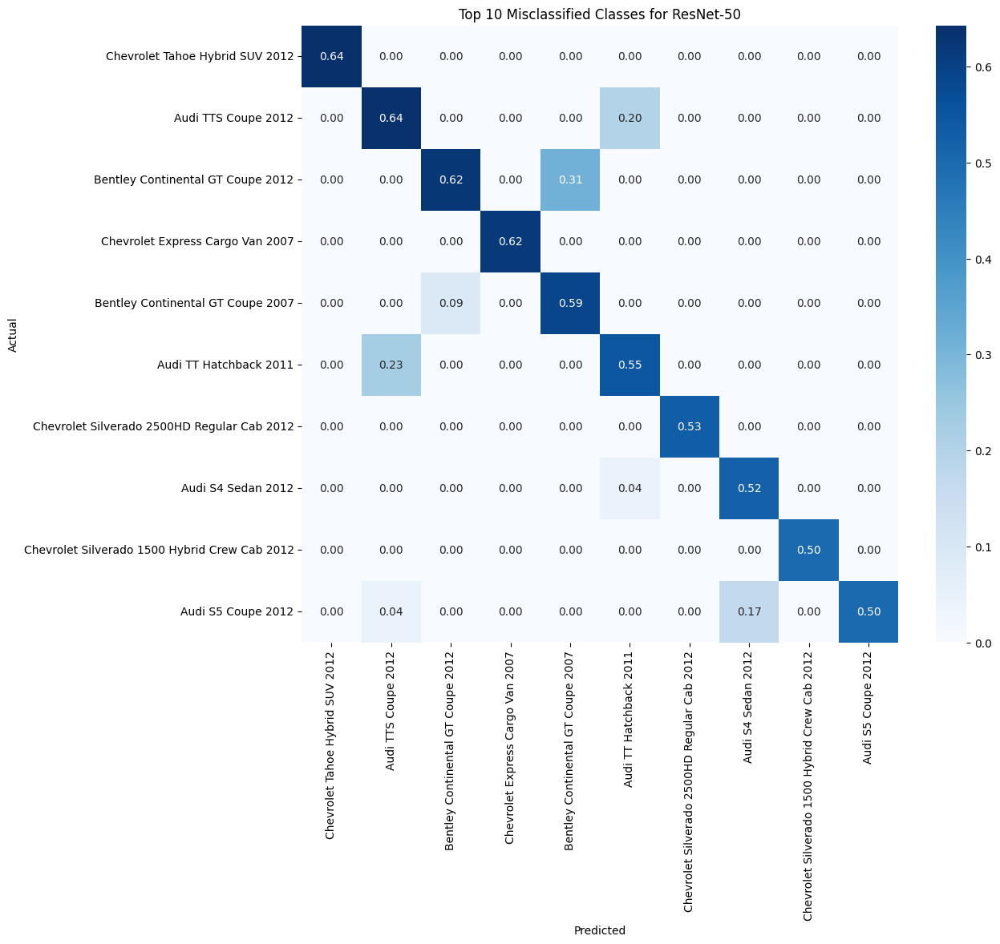


=== Top 10 Misclassified Classes for TResNet-L ===
Chevrolet Express Van 2007: 10 misclassified (50.00%)
Audi TTS Coupe 2012: 10 misclassified (40.00%)
Dodge Caliber Wagon 2012: 8 misclassified (40.00%)
Audi TT Hatchback 2011: 8 misclassified (36.36%)
HUMMER H2 SUT Crew Cab 2009: 5 misclassified (35.71%)
Chevrolet Silverado 1500 Regular Cab 2012: 8 misclassified (34.78%)
Audi V8 Sedan 1994: 8 misclassified (34.78%)
Audi S5 Coupe 2012: 8 misclassified (33.33%)
Bentley Continental GT Coupe 2007: 7 misclassified (31.82%)
BMW M6 Convertible 2010: 7 misclassified (30.43%)


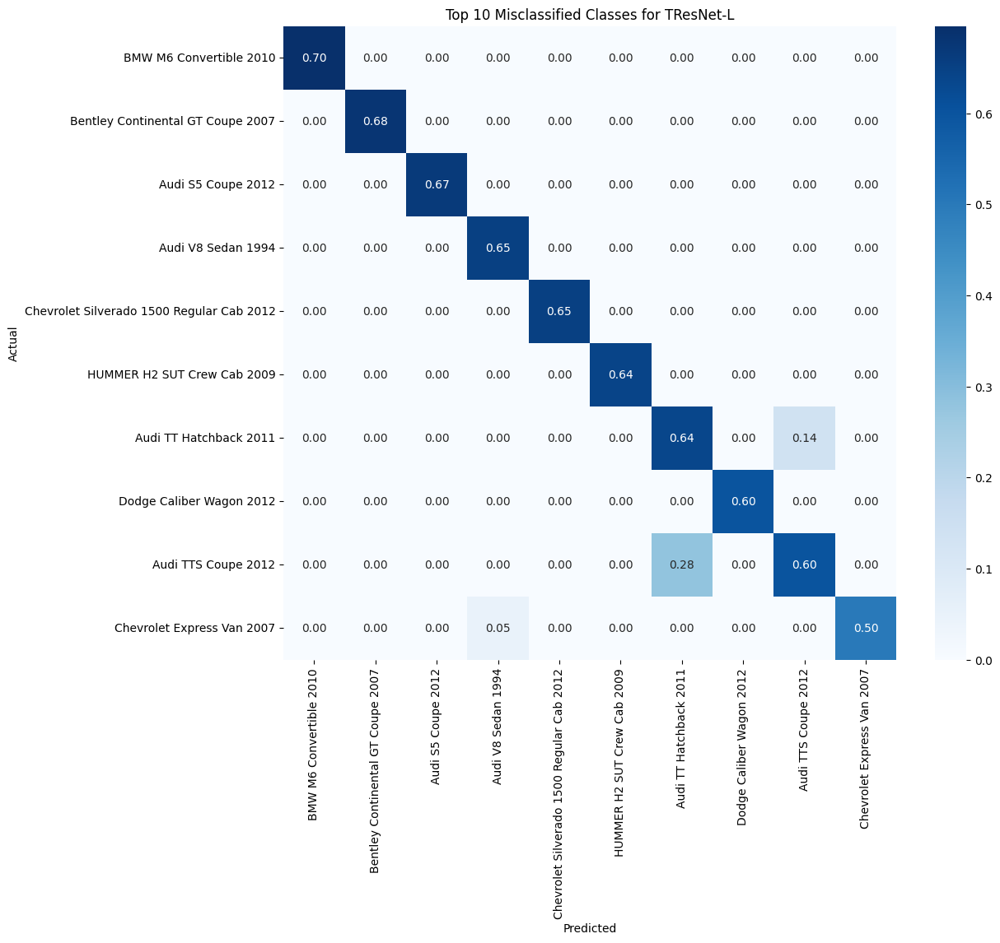


=== Top 10 Misclassified Classes for Vision Transformer ===
Audi 100 Wagon 1994: 12 misclassified (70.59%)
Audi S4 Sedan 2012: 16 misclassified (69.57%)
Audi TT Hatchback 2011: 13 misclassified (59.09%)
Acura RL Sedan 2012: 9 misclassified (50.00%)
HUMMER H2 SUT Crew Cab 2009: 7 misclassified (50.00%)
Chevrolet Silverado 2500HD Regular Cab 2012: 8 misclassified (47.06%)
Audi S5 Coupe 2012: 11 misclassified (45.83%)
Chevrolet Silverado 1500 Hybrid Crew Cab 2012: 8 misclassified (44.44%)
Ferrari 458 Italia Coupe 2012: 11 misclassified (44.00%)
BMW M6 Convertible 2010: 10 misclassified (43.48%)


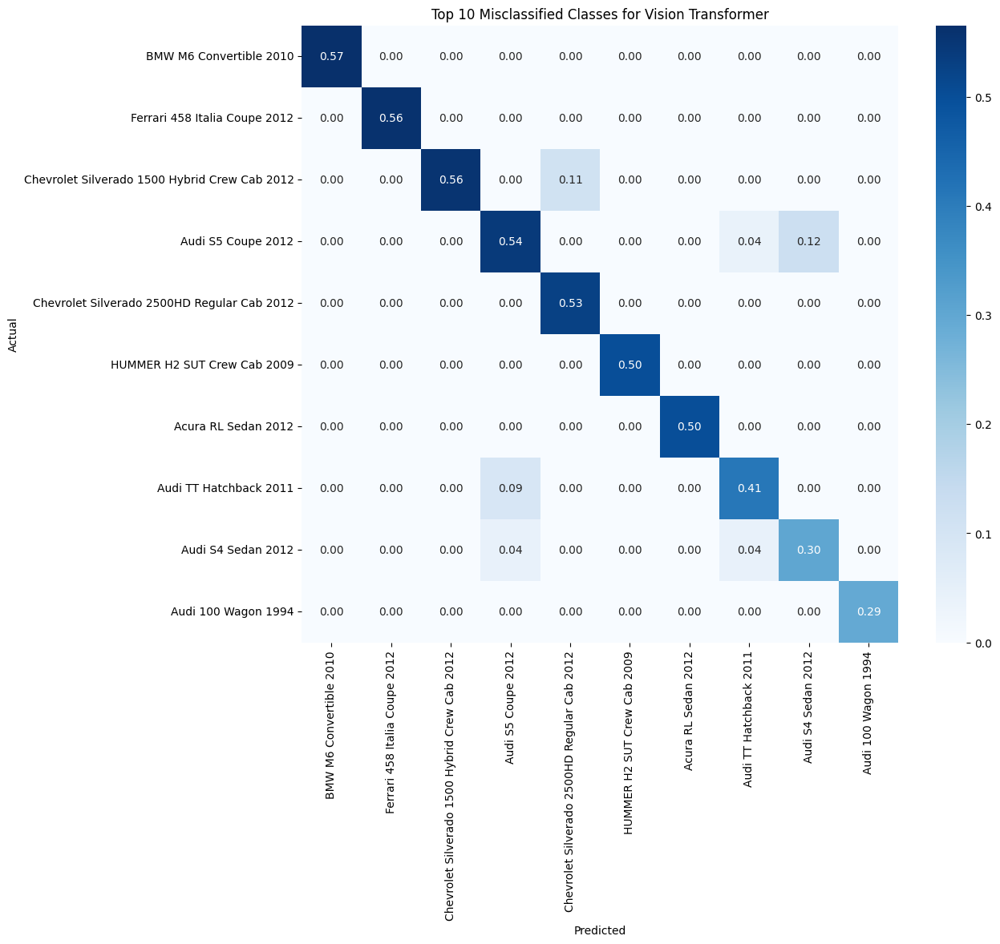


=== Top 10 Misclassified Classes for CBAM-ResNet ===
Audi TTS Coupe 2012: 20 misclassified (80.00%)
Audi S4 Sedan 2012: 17 misclassified (73.91%)
Acura RL Sedan 2012: 10 misclassified (55.56%)
Audi TT Hatchback 2011: 12 misclassified (54.55%)
Chevrolet Express Cargo Van 2007: 7 misclassified (53.85%)
Aston Martin V8 Vantage Convertible 2012: 16 misclassified (53.33%)
BMW M6 Convertible 2010: 12 misclassified (52.17%)
Hyundai Veracruz SUV 2012: 9 misclassified (50.00%)
Bentley Continental GT Coupe 2007: 11 misclassified (50.00%)
BMW M3 Coupe 2012: 9 misclassified (50.00%)


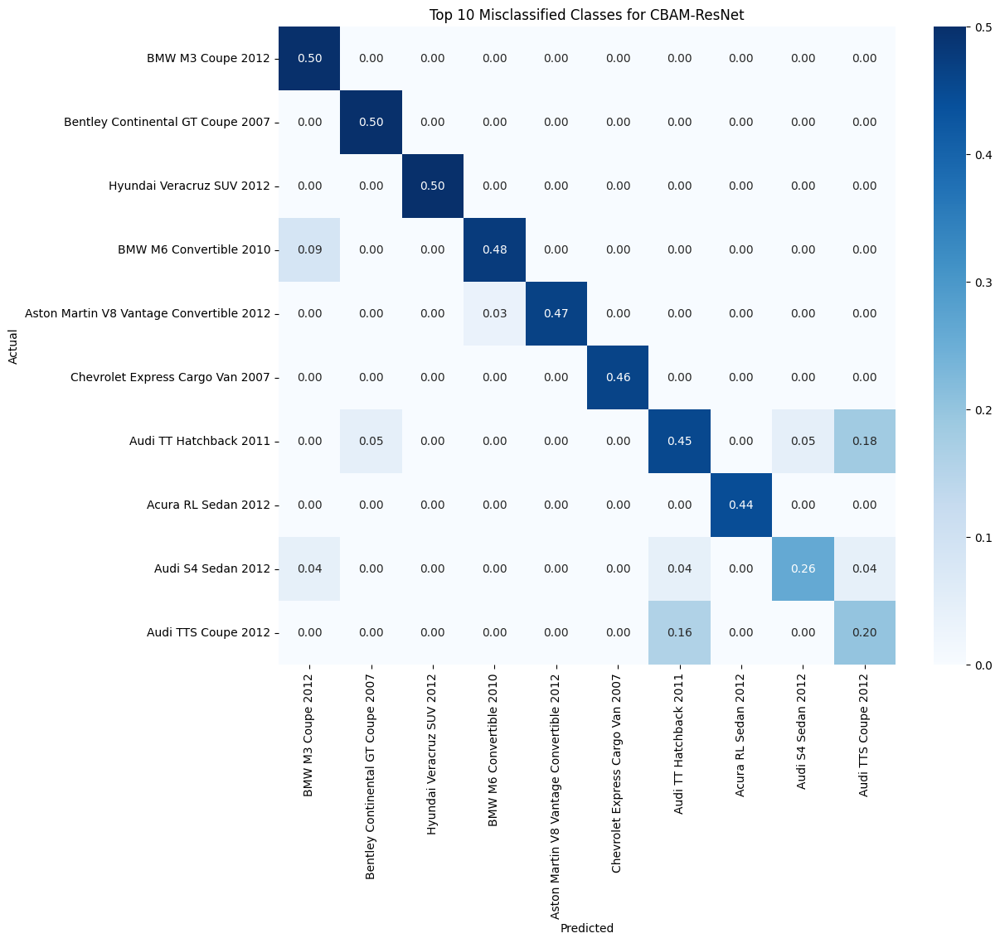

In [22]:
def plot_top_misclassified(model, test_loader, class_names, model_name, top_n=10):
    # Plot Top N Most Misclassified Classes
    model.eval()  # Set model to evaluation mode
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    cm_normalized = np.nan_to_num(cm.astype("float") / cm.sum(axis=1, keepdims=True))  # Normalize, avoiding NaN

    # Compute misclassification rates
    misclassified_counts = np.sum(cm, axis=1) - np.diag(cm)  # Count of misclassified samples per class
    misclassified_rates = misclassified_counts / np.maximum(np.sum(cm, axis=1), 1)  # Prevent division by zero
    top_misclassified_idx = np.argsort(misclassified_rates)[-top_n:]  # Select top misclassified classes

    # Print misclassification details
    print(f"\n=== Top {top_n} Misclassified Classes for {model_name} ===")
    for idx in reversed(top_misclassified_idx):  # Sort from highest to lowest
        print(f"{class_names[idx]}: {misclassified_counts[idx]} misclassified ({misclassified_rates[idx]:.2%})")

    # Extract subset for top misclassified classes
    cm_top = cm_normalized[top_misclassified_idx, :][:, top_misclassified_idx]
    class_labels_top = [class_names[i] for i in top_misclassified_idx]

    # Plot confusion matrix for top misclassified classes
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_top, annot=True, cmap="Blues", fmt=".2f", 
                xticklabels=class_labels_top, yticklabels=class_labels_top)
    plt.title(f"Top {top_n} Misclassified Classes for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()


# Class Names from Training Dataset
class_names = train_dataset.classes

# Evaluate and Plot for Each Model
plot_top_misclassified(trained_models["ResNet-50"], test_loader, class_names, model_name="ResNet-50")
plot_top_misclassified(trained_models["TResNet-L"], test_loader, class_names, model_name="TResNet-L")
plot_top_misclassified(trained_models["Vision Transformer"], test_loader, class_names, model_name="Vision Transformer")
plot_top_misclassified(trained_models["CBAM-ResNet"], test_loader, class_names, model_name="CBAM-ResNet")

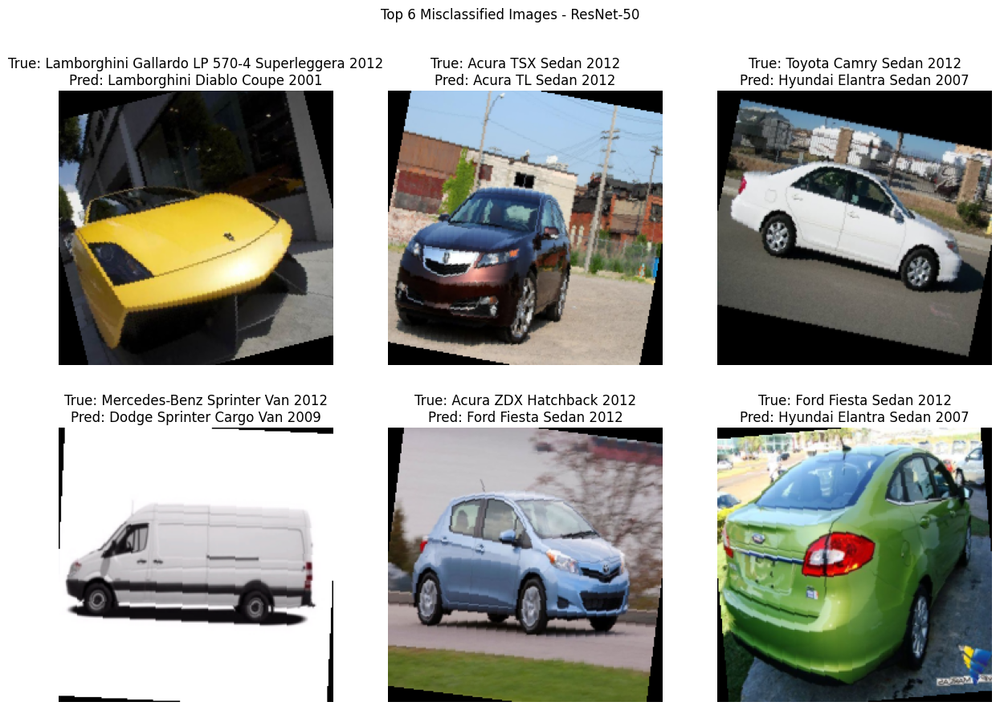

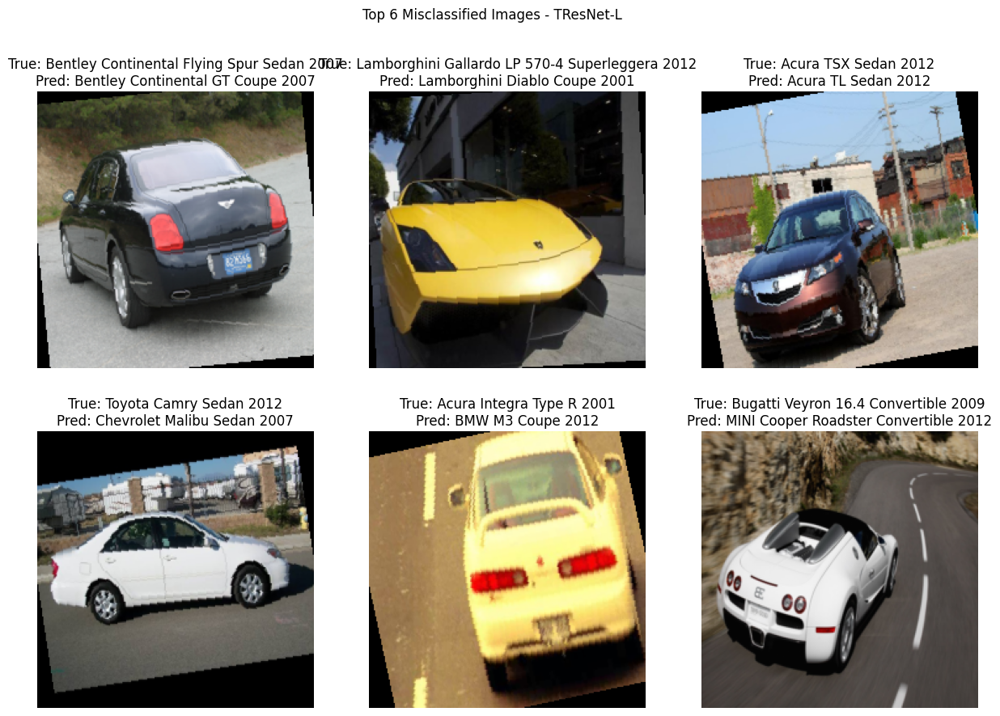

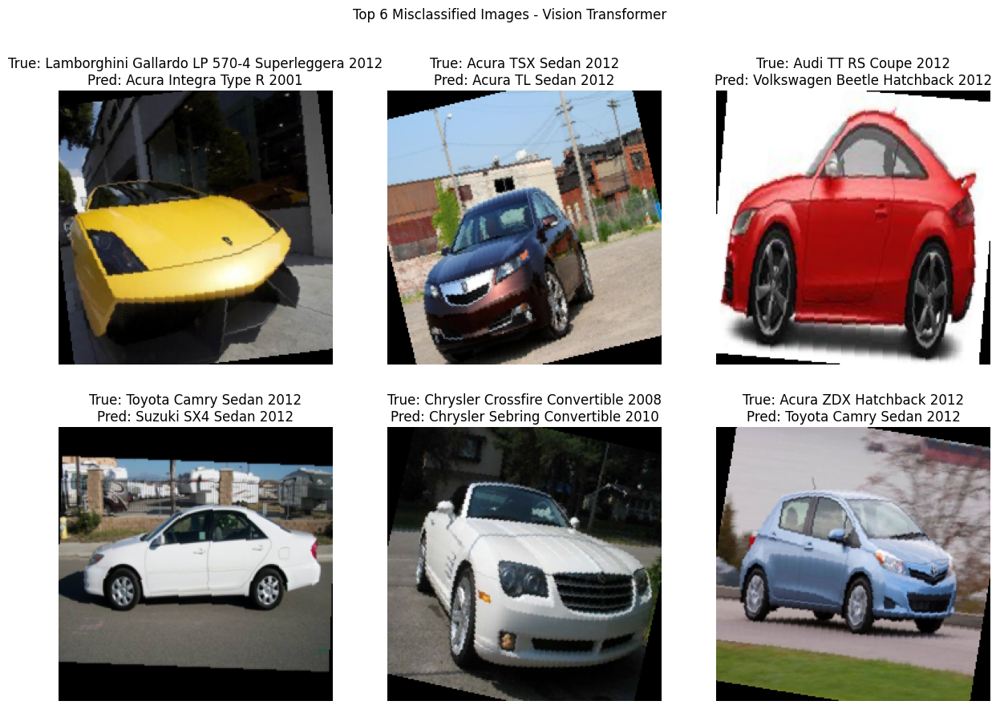

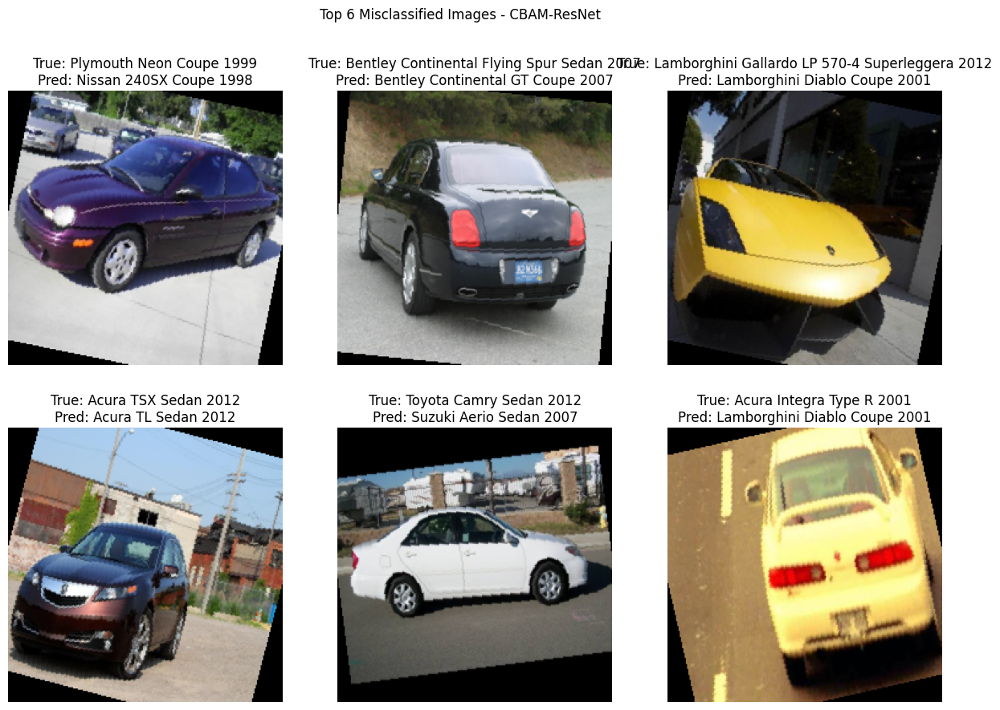

In [23]:
def show_misclassified_images(model, test_loader, class_names, model_name, num_images=6):
    # Display Misclassified Images with Predicted and True Labels
    model.eval()
    misclassified_images = []
    misclassified_labels = []
    misclassified_preds = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs, 1)
            
            # Collect misclassified examples
            for i in range(len(labels)):
                if preds[i] != labels[i]:
                    misclassified_images.append(images[i].cpu())
                    misclassified_labels.append(labels[i].cpu().item())
                    misclassified_preds.append(preds[i].cpu().item())

    # Display the first num_images misclassified images
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        plt.subplot(2, 3, i+1)
        image = misclassified_images[i]
        # Denormalize the image for display
        image = image * 0.5 + 0.5  # Inverse normalization
        image = np.transpose(image.numpy(), (1, 2, 0))
        plt.imshow(image)
        plt.title(f"True: {class_names[misclassified_labels[i]]}\nPred: {class_names[misclassified_preds[i]]}")
        plt.axis('off')

    plt.suptitle(f"Top {num_images} Misclassified Images - {model_name}")
    plt.show()

# Call the function for each model
show_misclassified_images(trained_models["ResNet-50"], test_loader, class_names, model_name="ResNet-50")
show_misclassified_images(trained_models["TResNet-L"], test_loader, class_names, model_name="TResNet-L")
show_misclassified_images(trained_models["Vision Transformer"], test_loader, class_names, model_name="Vision Transformer")
show_misclassified_images(trained_models["CBAM-ResNet"], test_loader, class_names, model_name="CBAM-ResNet")

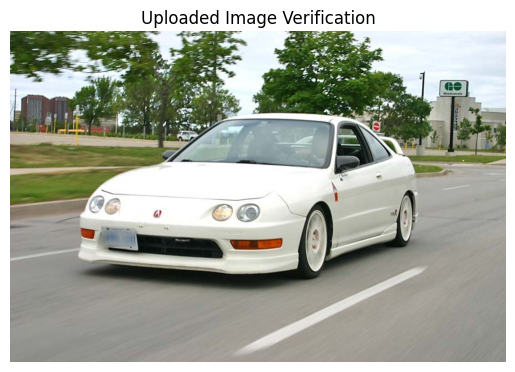

In [24]:
# Load the uploaded image
image_path = "./sample_image.jpg"
image = Image.open(image_path).convert("RGB")

# Display the image to confirm
plt.imshow(image)
plt.axis("off")
plt.title("Uploaded Image Verification")
plt.show()


In [25]:
from PIL import Image
import torchvision.transforms as transforms

# Load your image
image_path = "./sample_image.jpg"  # Replace with your image path
image = Image.open(image_path).convert("RGB")

# Define the same transformations used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize
])

# Apply transformations
input_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension

In [26]:
def reshape_transform(tensor, height=14, width=14):
    # Reshape ViT embeddings into a 2D grid
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.permute(0, 3, 1, 2)  # Move channels to the first dimension
    return result

In [27]:
def apply_gradcam(model, target_layer, image_tensor, model_name, original_image):
    # Apply Grad-CAM and overlay on the correct uploaded image
    
    model.eval()

    # Use reshape_transform ONLY for Vision Transformer
    reshape_fn = reshape_transform if "Vision Transformer" in model_name else None

    # Create Grad-CAM object
    cam = GradCAM(model=model, target_layers=[target_layer], reshape_transform=reshape_fn)

    # Compute Grad-CAM heatmap
    grayscale_cam = cam(input_tensor=image_tensor)[0]  # Extract heatmap

    # Normalize heatmap
    grayscale_cam = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min())

    # Resize heatmap to match the original image size
    heatmap = cv2.resize(grayscale_cam, (original_image.size[0], original_image.size[1]))

    # Convert original PIL image to NumPy array
    original_image_np = np.array(original_image)

    # Overlay heatmap on the correct uploaded image
    plt.figure(figsize=(6, 6))
    plt.imshow(original_image_np, alpha=0.5)  # Ensure original uploaded image is used
    plt.imshow(heatmap, cmap="jet", alpha=0.6)  # Grad-CAM heatmap
    plt.axis("off")
    plt.title(f"Grad-CAM for {model_name}")
    plt.show()



Applying Grad-CAM to ResNet-50...


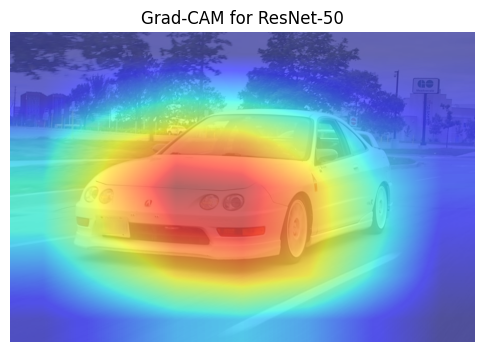


Applying Grad-CAM to TResNet-L...


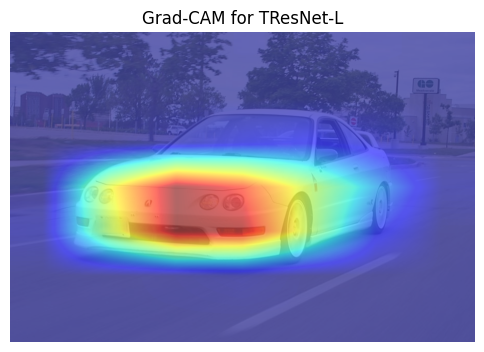


Applying Grad-CAM to Vision Transformer...


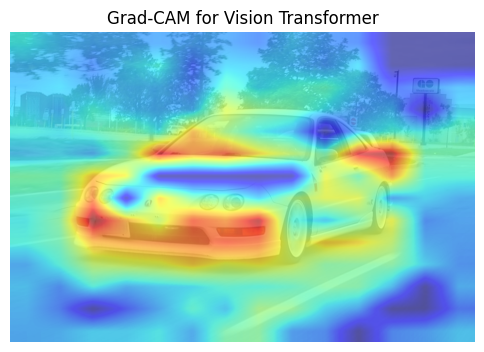


Applying Grad-CAM to CBAM-ResNet...


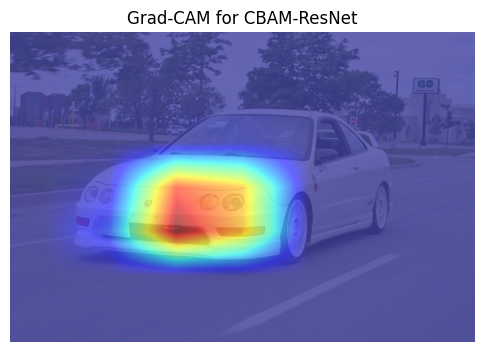

In [28]:
for model_name, model in trained_models.items():
    print(f"\nApplying Grad-CAM to {model_name}...")

    # Define correct target layer for each model
    if model_name == "ResNet-50":
        target_layer = model.layer4[-1]  # Last convolutional block
    elif model_name == "TResNet-L":
        target_layer = model.body[-1]  # Last layer of body
    elif model_name == "Vision Transformer":
        target_layer = model.blocks[-1].norm1  # ViT attention block
    elif model_name == "CBAM-ResNet":
        target_layer = model.cbam  # Last CBAM layer

    apply_gradcam(model, target_layer, input_tensor, model_name, image)

In [32]:
import os
from PIL import Image
import torch
import torchvision.transforms as transforms

def inference_folder(models, folder_path, class_names):
    # Infer all images in a folder using multiple models
    # Check if folder exists
    if not os.path.isdir(folder_path):
        print(f"Folder not found: {folder_path}")
        return
    
    # Get the actual class from the folder name
    actual_class = os.path.basename(folder_path)
    
    # Prepare image transformation (same as training)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images
        transforms.ToTensor(),  # Convert to tensor
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize
    ])
    
    # Iterate through all images in the folder
    image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    if not image_files:
        print(f"No images found in folder: {folder_path}")
        return
    
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = Image.open(image_path).convert("RGB")
        
        # Transform image
        input_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension
        
        # Perform inference with all models
        print(f"\n=== Inference Results for {image_file} ===")
        for model_name, model in models.items():
            model.eval()
            with torch.no_grad():
                outputs = model(input_tensor)
                _, predicted_idx = outputs.max(1)
                predicted_class = class_names[predicted_idx.item()]
            
            # Display result
            print(f"{model_name}: Predicted = {predicted_class}, Actual = {actual_class}")


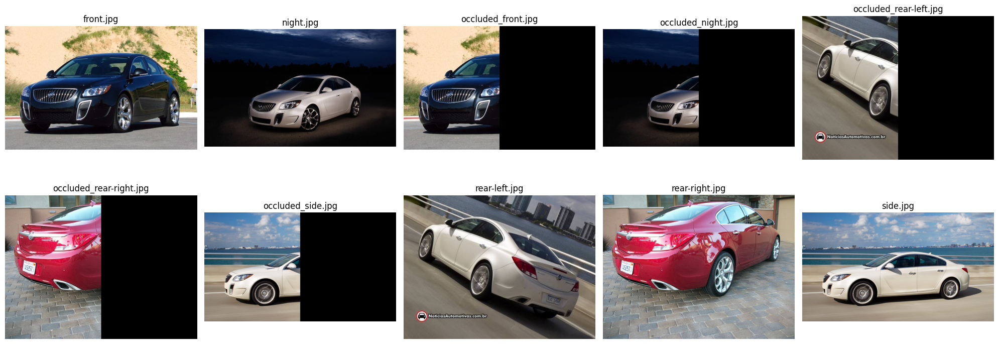

In [42]:
# Path to the image folder
folder_path = "./images/Buick Regal GS 2012"

# Get list of image files in the folder
image_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Set the number of images per row
images_per_row = 5
total_images = len(image_files)
rows = (total_images // images_per_row) + int(total_images % images_per_row > 0)

# Plot images
plt.figure(figsize=(20, rows * 4))
for i, image_file in enumerate(image_files):
    image_path = os.path.join(folder_path, image_file)
    image = Image.open(image_path)
    plt.subplot(rows, images_per_row, i + 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title(image_file)

plt.tight_layout()
plt.show()

In [33]:
folder_path = "./images/Buick Regal GS 2012"  # Path to folder containing images
class_names = train_dataset.classes  # List of class names from the training set
inference_folder(trained_models, folder_path, class_names)



=== Inference Results for front.jpg ===
ResNet-50: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
TResNet-L: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
Vision Transformer: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
CBAM-ResNet: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012

=== Inference Results for night.jpg ===
ResNet-50: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
TResNet-L: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
Vision Transformer: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
CBAM-ResNet: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012

=== Inference Results for rear-left.jpg ===
ResNet-50: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
TResNet-L: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
Vision Transformer: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
CBAM-ResNet: Predicted = Buick Regal GS

In [34]:
def create_occluded_images(input_folder, output_folder, occlusion_type="half"):
    # Generate occluded images by blocking parts of the image
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    image_files = [f for f in os.listdir(input_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]

    for image_file in image_files:
        image_path = os.path.join(input_folder, image_file)
        image = cv2.imread(image_path)

        # Get image dimensions
        height, width, _ = image.shape

        # Create occlusion mask
        if occlusion_type == "half":
            # Block the right half of the image
            image[:, width//2:] = (0, 0, 0)  # Black rectangle on the right half

        elif occlusion_type == "quarter":
            # Block the bottom right quarter of the image
            image[height//2:, width//2:] = (0, 0, 0)  # Black rectangle on the bottom right quarter

        elif occlusion_type == "center":
            # Block the center region (e.g., car logo or grille area)
            center_x, center_y = width//2, height//2
            box_size = min(width, height) // 4
            image[center_y-box_size:center_y+box_size, center_x-box_size:center_x+box_size] = (0, 0, 0)

        # Save occluded image
        output_path = os.path.join(output_folder, f"occluded_{image_file}")
        cv2.imwrite(output_path, image)

        print(f"Saved occluded image: {output_path}")

# Example usage
input_folder = "./images/Buick Regal GS 2012"
output_folder = "./images/Buick Regal GS 2012/Occluded"
create_occluded_images(input_folder, output_folder, occlusion_type="half")

Saved occluded image: ./images/Buick Regal GS 2012/Occluded\occluded_front.jpg
Saved occluded image: ./images/Buick Regal GS 2012/Occluded\occluded_night.jpg
Saved occluded image: ./images/Buick Regal GS 2012/Occluded\occluded_rear-left.jpg
Saved occluded image: ./images/Buick Regal GS 2012/Occluded\occluded_rear-right.jpg
Saved occluded image: ./images/Buick Regal GS 2012/Occluded\occluded_side.jpg


In [37]:
folder_path = "./images/Buick Regal GS 2012"  # Path to folder containing images
class_names = train_dataset.classes  # List of class names from the training set
inference_folder(trained_models, folder_path, class_names)



=== Inference Results for front.jpg ===
ResNet-50: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
TResNet-L: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
Vision Transformer: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
CBAM-ResNet: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012

=== Inference Results for night.jpg ===
ResNet-50: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
TResNet-L: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
Vision Transformer: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
CBAM-ResNet: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012

=== Inference Results for occluded_front.jpg ===
ResNet-50: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
TResNet-L: Predicted = Buick Regal GS 2012, Actual = Buick Regal GS 2012
Vision Transformer: Predicted = Buick Verano Sedan 2012, Actual = Buick Regal GS 2012
CBAM-ResNet: Predicted = Buick

In [38]:
# Load your image
image_path = "./images/Buick Regal GS 2012/occluded_rear-left.jpg"  # Replace with your image path
image = Image.open(image_path).convert("RGB")

# Define the same transformations used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize
])

# Apply transformations
input_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension


Applying Grad-CAM to ResNet-50...


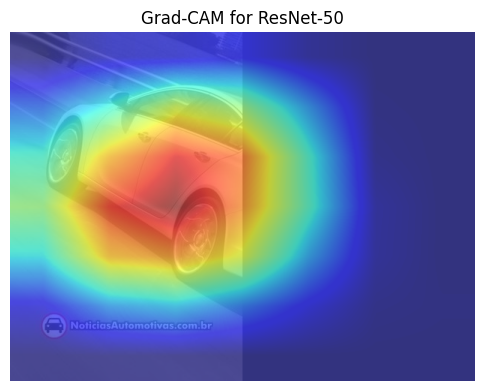


Applying Grad-CAM to TResNet-L...


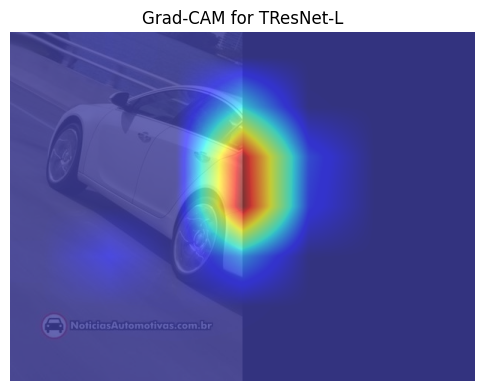


Applying Grad-CAM to Vision Transformer...


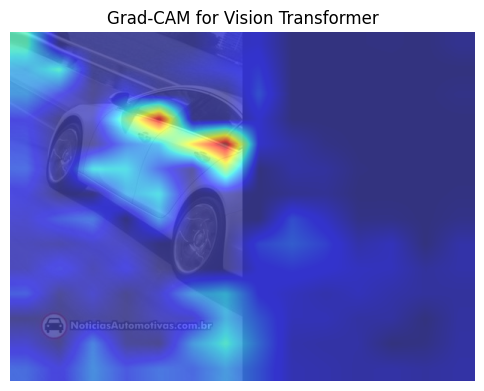


Applying Grad-CAM to CBAM-ResNet...


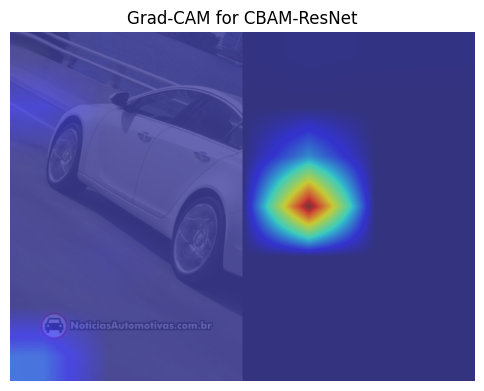

In [39]:
for model_name, model in trained_models.items():
    print(f"\nApplying Grad-CAM to {model_name}...")

    # Define correct target layer for each model
    if model_name == "ResNet-50":
        target_layer = model.layer4[-1]  # Last convolutional block
    elif model_name == "TResNet-L":
        target_layer = model.body[-1]  # Last layer of body
    elif model_name == "Vision Transformer":
        target_layer = model.blocks[-1].norm1  # ViT attention block
    elif model_name == "CBAM-ResNet":
        target_layer = model.cbam  # Last CBAM layer

    apply_gradcam(model, target_layer, input_tensor, model_name, image)

In [40]:
# Load your image
image_path = ".//images/Buick Regal GS 2012/occluded_rear-right.jpg"  # Replace with your image path
image = Image.open(image_path).convert("RGB")

# Define the same transformations used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize
])

# Apply transformations
input_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension


Applying Grad-CAM to ResNet-50...


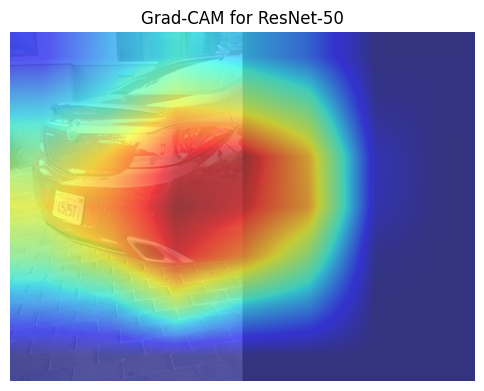


Applying Grad-CAM to TResNet-L...


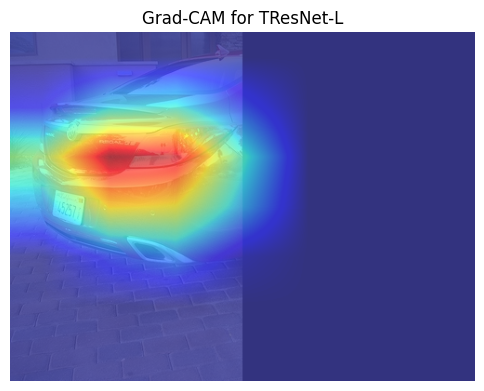


Applying Grad-CAM to Vision Transformer...


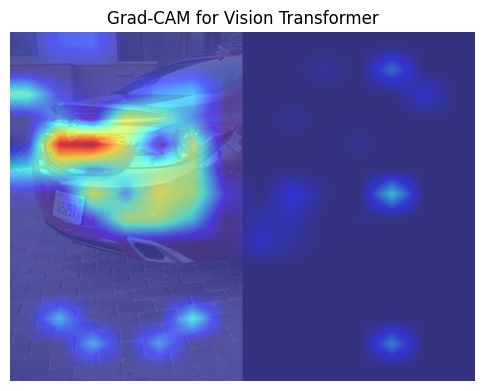


Applying Grad-CAM to CBAM-ResNet...


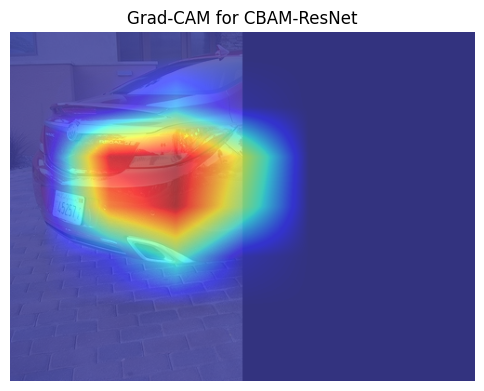

In [41]:
for model_name, model in trained_models.items():
    print(f"\nApplying Grad-CAM to {model_name}...")

    # Define correct target layer for each model
    if model_name == "ResNet-50":
        target_layer = model.layer4[-1]  # Last convolutional block
    elif model_name == "TResNet-L":
        target_layer = model.body[-1]  # Last layer of body
    elif model_name == "Vision Transformer":
        target_layer = model.blocks[-1].norm1  # ViT attention block
    elif model_name == "CBAM-ResNet":
        target_layer = model.cbam  # Last CBAM layer

    apply_gradcam(model, target_layer, input_tensor, model_name, image)